In [1]:
library(gridExtra)
library(matrixStats)
library(dplyr)
library(rlang)
library(reshape2)
library(clusterCrit)
library(grid)
library(ggrepel)
library(RColorBrewer)
library(dplyr)
library(IRdisplay)
library(scales)
library(survival)
library(corrplot)
library(Hmisc)
library(ggplot2)
library(survminer)
library(muhaz)
library(dplyr)
library(stringr)
library(dummies)
library(miceadds)
options(warn=-1)
library(data.table)
library(tidyr)
library(arules)

source('../../../../src/tools.R')     # custom tools function
source('../../../../src/hdp_tools_yanis.R')
source("../../../../src/merge_df.R")
source("../../../../src/my_toolbox.R")
source("../../../../src/my_components.R")
source("../../../../src/my_utils.R")
source("../../../../src/ggstyles.R")
source("../../../../src/my_hotspots.R")
###
source("../../../script_figures/tools.R")

theme_set(theme_minimal())

# set jupyer notebook parameters
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 200, # set the maximum number of rows displayed
        repr.matrix.max.cols = 200) # set the maximum number of columns displayed






Attaching package: ‘dplyr’

The following object is masked from ‘package:matrixStats’:

    count

The following object is masked from ‘package:gridExtra’:

    combine

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: ggplot2

Attaching package: ‘survival’

The following object is masked from ‘package:clusterCrit’:

    concordance

corrplot 0.84 loaded
Loading required package: lattice
Loading required package: Formula

Attaching package: ‘Hmisc’

The following objects are masked from ‘package:dplyr’:

    src, summarize

The following objects are masked from ‘package:base’:

    format.pval, units

Loading required package: ggpubr
Loading required package: magrittr

Attaching package: ‘magrittr’

The following object is masked from ‘package:rlang’:

    set_names

dummies-1.5.6 provided by Decision Patterns

Loading required package: mice

In [2]:
nejm_data <- read.table("../Validation/full_data_validation_NO_ITD.tsv")
load.Rdata("../Validation/AMLSG_Clinical_Anon.RData","val_data")
rownames(val_data) <- val_data$PDID


In [3]:
nejm_data_tpl <- merge(nejm_data,val_data[,c("TPL_type","TPL_o","TPL_date")],by=0)
nejm_data_tpl$TPL_date <- as.numeric(nejm_data_tpl$TPL_date)/365
comp <- colnames(nejm_data_tpl[,c(91:107)])
gen <- colnames(nejm_data_tpl[,c(2:58)])
cyto <- colnames(nejm_data_tpl[,c(59:81)])

In [4]:
df_tmp <- nejm_data_tpl[,c(comp,"TPL_o")]

df_tmp_no_tpl <- df_tmp[df_tmp$TPL_o==0,]
no_tpl <- data.frame(freq = 100*colSums(df_tmp_no_tpl[,comp])/nrow(nejm_data_tpl),Transplant="No")
no_tpl$names <- rownames(no_tpl)

df_tmp_tpl <- df_tmp[df_tmp$TPL_o==1,]
tpl <- data.frame(freq = 100*colSums(df_tmp_tpl[,comp])/nrow(nejm_data_tpl),Transplant="Yes")
tpl$names <- rownames(tpl)

r <- rbind(no_tpl,tpl)
r
r$names <- str_replace(r$names,"full_component_","")
p <- ggplot(r,aes(reorder(names,freq),freq,fill=Transplant))+
        geom_bar(stat="identity",aes(fill=Transplant))+
        coord_flip()+
        xlab("Components") + ylab("Frequency over the cohort (%)")+scale_fill_manual(values=c("#e79f00", "#009E73"))+
scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+
labs(fill='Transplant') +ggtitle(" Repartition of the components representation in dataset across transplant status")+
theme(axis.text.x=element_text(size=22,face="bold"),axis.title.x = element_text(size=25),axis.text.y=element_text(size=22,face="bold"),axis.title.y = element_text(size=25),legend.text = element_text(size=25),legend.title = element_text(size=30),
      plot.title = element_text(size=25,face="bold",hjust=0.5))+
                   ylab("Frequency (%)")+xlab("Components")

,freq,Transplant,names
full_component_t_15_17,3.0612245,No,full_component_t_15_17
full_component_inv_16,2.2108844,No,full_component_inv_16
full_component_t_8_21,2.2108844,No,full_component_t_8_21
full_component_t_11,0.4251701,No,full_component_t_11
full_component_t_6_9,0.3401361,No,full_component_t_6_9
full_component_inv_3,0.6802721,No,full_component_inv_3
full_component_additions,3.8265306,No,full_component_additions
full_component_TP53_complex,5.3571429,No,full_component_TP53_complex
full_component_NPM1,15.2210884,No,full_component_NPM1
full_component_CEBPA_bi,2.2108844,No,full_component_CEBPA_bi


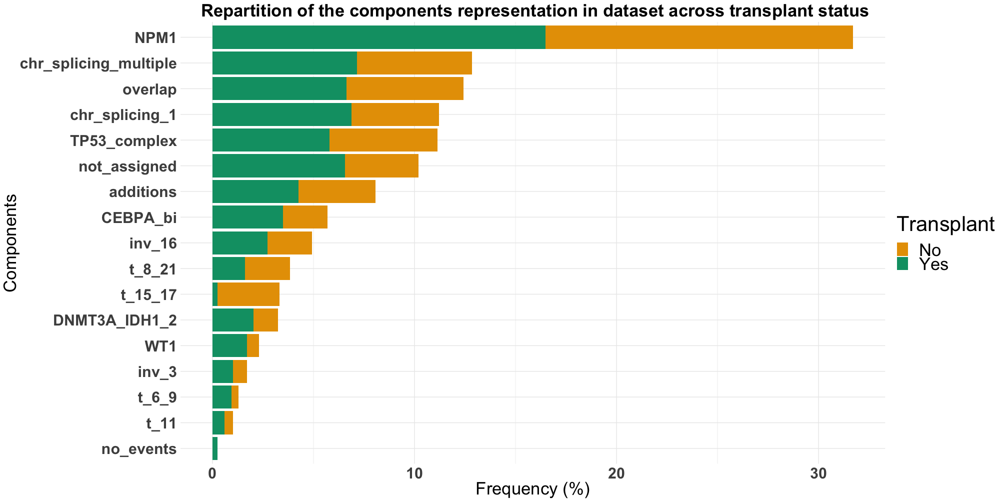

In [5]:
set_notebook_plot_size(20,10)
p

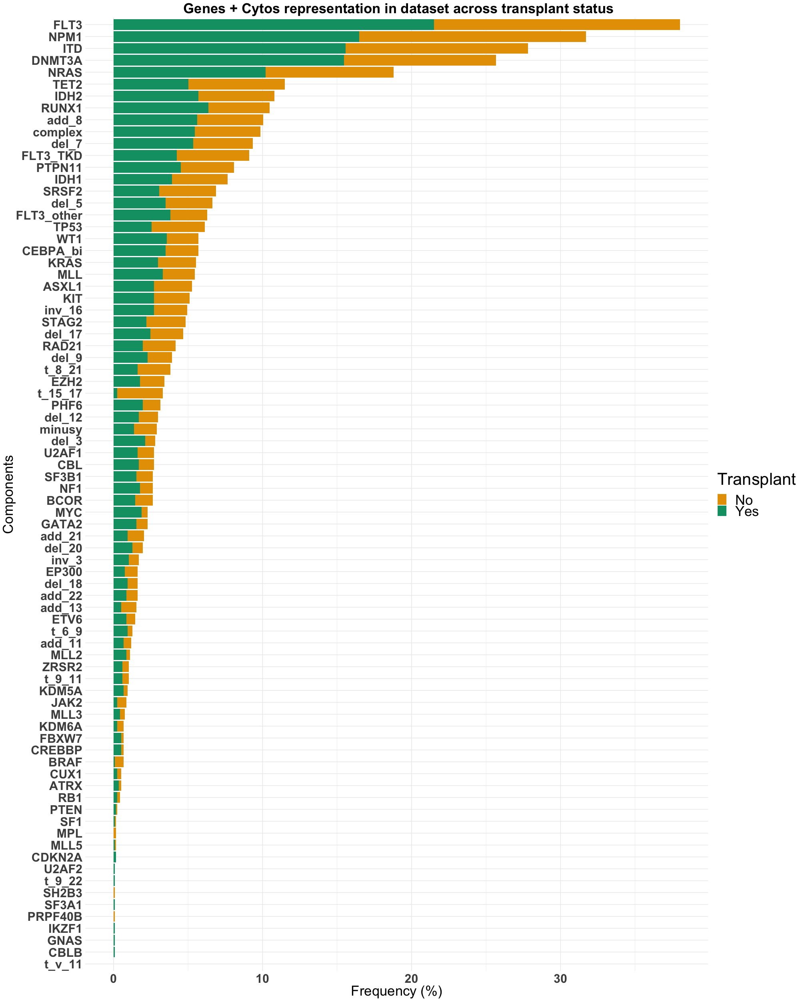

In [6]:
df_tmp <- nejm_data_tpl[,c(gen,cyto,"TPL_o")]

df_tmp_no_tpl <- df_tmp[df_tmp$TPL_o==0,]
no_tpl <- data.frame(freq = 100*colSums(df_tmp_no_tpl[,c(gen,cyto)])/nrow(nejm_data_tpl),Transplant="No")
no_tpl$names <- rownames(no_tpl)

df_tmp_tpl <- df_tmp[df_tmp$TPL_o==1,]
tpl <- data.frame(freq = 100*colSums(df_tmp_tpl[,c(gen,cyto)])/nrow(nejm_data_tpl),Transplant="Yes")
tpl$names <- rownames(tpl)

r <- rbind(no_tpl,tpl)
# r
r$names <- str_replace(r$names,"full_component_","")

p <- ggplot(r,aes(reorder(names,freq),freq,fill=Transplant))+
        geom_bar(stat="identity",aes(fill=Transplant))+
        coord_flip()+
        xlab("Molecular features") + ylab("Frequency over the cohort (%)")+scale_fill_manual(values=c("#e79f00", "#009E73"))+
scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+
labs(fill='Transplant') +ggtitle(" Genes + Cytos representation in dataset across transplant status")+
theme(axis.text.x=element_text(size=22,face="bold"),axis.title.x = element_text(size=25),axis.text.y=element_text(size=22,face="bold"),axis.title.y = element_text(size=25),legend.text = element_text(size=25),legend.title = element_text(size=30),
      plot.title = element_text(size=25,face="bold",hjust=0.5))+
                   ylab("Frequency (%)")+xlab("Components")
set_notebook_plot_size(20,25)
                   p          

# 1) Clinical Correlates Analysis for Transplanted vs Non Transplanted Patients

# only difference in terms of correlates is the age.

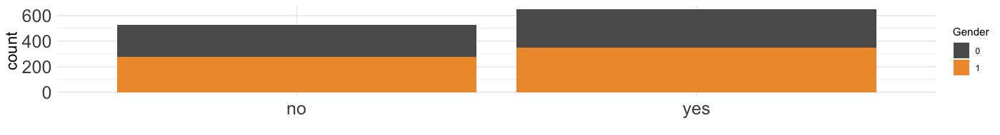

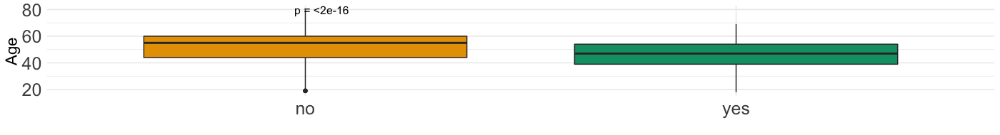

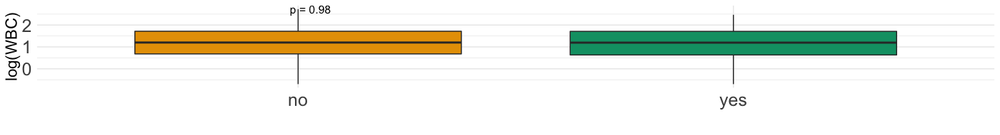

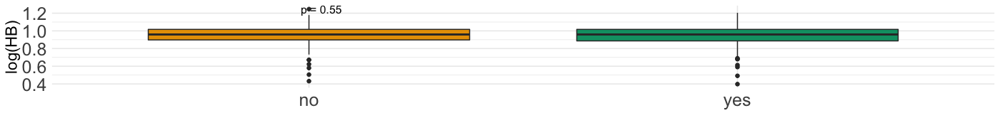

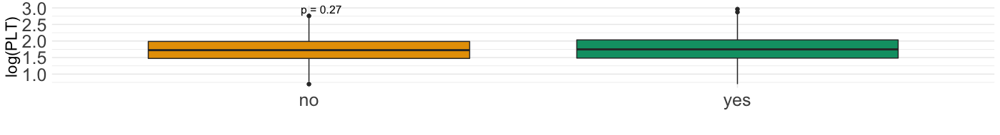

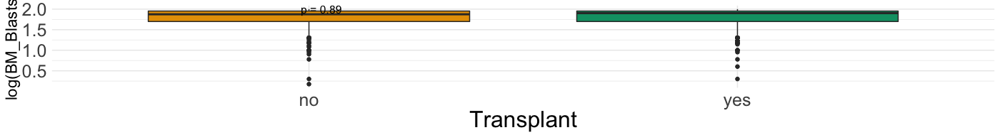

In [109]:
set_notebook_plot_size(14,1.9)
# png("transplant_figures/clin_corr.png",width=4000,height=6250,res=650)

binary_correlates <- c("Gender")
continuous_correlates <- c("Age","WBC","HB","PLT","BM_Blasts")

tmp <- nejm_data_tpl
tmp$Transplant <- ifelse(tmp$TPL_o==1,"yes","no")

ggplot(tmp,aes(Transplant,fill=factor(Gender)))+geom_bar()+labs(fill='Gender')+scale_fill_manual(values=c("#5C5C5C","#EE9937"))+xlab("")+theme(axis.title.y=element_text(size=16))+theme(axis.text=element_text(size=18))
ggplot(tmp,aes(x=Transplant,y=Age,fill=Transplant))+geom_boxplot()+stat_compare_means(aes(label = paste0("p = ", ..p.format..)),size=4)+scale_fill_manual(values=c("#e79f00", "#009E73"))+theme(legend.position = "none")+xlab("")+
theme(axis.title.y=element_text(size=16))+theme(axis.text=element_text(size=18))

for (corr in continuous_correlates[continuous_correlates!="Age"]){
    plot(ggplot(tmp,aes(x=Transplant,y=log(tmp[,corr],10),fill=Transplant))+geom_boxplot()+stat_compare_means(aes(label = paste0("p = ", ..p.format..)),size=4)+ylab(paste("log(",corr,")",sep=""))+scale_fill_manual(values=c("#e79f00", "#009E73"))+theme(legend.position = "none")+
                    xlab(ifelse(corr=="BM_Blasts","Transplant",""))+theme(axis.title.y=element_text(size=16))+theme(axis.text=element_text(size=18))+theme(axis.title.x=element_text(size=23)))
}
# do.call("grid.arrange",c(p,ncol=1))
# dev.off()

# 2) Factors leading to transplant


## A) Transplant predictors

In [8]:
tmp <- nejm_data_tpl[,c(gen,cyto,"TPL_o")]
tmp$Transplant <- ifelse(tmp$TPL_o==1,1,0)
tmp$TPL_o <- NULL
tmp <- cbind.data.frame(tmp,Description = apply(tmp, 1, function(x)paste(colnames(tmp)[x[1:length(x)] == 1], collapse = ", ")))
tmp <- tmp[,ncol(tmp)]
tmp <- data.frame(itemList=tmp)
write.csv(tmp,"ItemList.csv", quote = FALSE, row.names = TRUE)

txn = read.transactions(file="ItemList.csv", rm.duplicates= TRUE, format="basket",sep=",",cols=1)
txn@itemInfo$labels <- gsub("\"","",txn@itemInfo$labels)
rules <- apriori(txn,parameter = list(sup = 0.01, conf = 0.5,target="rules"))
                                                
ruledf = data.frame(
       lhs = labels(lhs(rules)),
       rhs = labels(rhs(rules)), 
       rules@quality)
ruledf <- ruledf[ ruledf$rhs=="{Transplant}" & ruledf$lift >1 & ruledf$confidence >=0.8,]
colnames(ruledf)[colnames(ruledf) %in% c("lhs","rhs")] <- c("Rules","Target")

ruledf

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
        0.5    0.1    1 none FALSE            TRUE       5    0.01      1
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 11 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[81 item(s), 1177 transaction(s)] done [0.00s].
sorting and recoding items ... [57 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 5 done [0.00s].
writing ... [463 rule(s)] done [0.00s].
creating S4 object  ... done [0.00s].


,Rules,Target,support,confidence,lift,count
10,{MYC},{Transplant},0.01869159,0.8148148,1.482283,22
105,"{CEBPA_bi,WT1}",{Transplant},0.01019541,0.9230769,1.679230,12
125,"{ITD,MLL}",{Transplant},0.01019541,0.8000000,1.455332,12
258,"{complex,NRAS}",{Transplant},0.01019541,0.8000000,1.455332,12


## B) No Transplant predictors

In [9]:
tmp <- nejm_data_tpl[,c(gen,cyto,"TPL_o")]
tmp$no_Transplant <- ifelse(tmp$TPL_o==0,1,0)
tmp$TPL_o <- NULL
tmp <- cbind.data.frame(tmp,Description = apply(tmp, 1, function(x)paste(colnames(tmp)[x[1:length(x)] == 1], collapse = ", ")))
tmp <- tmp[,ncol(tmp)]
tmp <- data.frame(itemList=tmp)
write.csv(tmp,"ItemList.csv", quote = FALSE, row.names = TRUE)

txn = read.transactions(file="ItemList.csv", rm.duplicates= TRUE, format="basket",sep=",",cols=1)
txn@itemInfo$labels <- gsub("\"","",txn@itemInfo$labels)
rules <- apriori(txn,parameter = list(sup = 0.01, conf = 0.5,target="rules"))
                                                
ruledf = data.frame(
       lhs = labels(lhs(rules)),
       rhs = labels(rhs(rules)), 
       rules@quality)
ruledf <- ruledf[ ruledf$rhs=="{no_Transplant}" & ruledf$lift >1 & ruledf$confidence >=0.8,]
colnames(ruledf)[colnames(ruledf) %in% c("lhs","rhs")] <- c("Rules","Target")
ruledf

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
        0.5    0.1    1 none FALSE            TRUE       5    0.01      1
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 11 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[81 item(s), 1177 transaction(s)] done [0.00s].
sorting and recoding items ... [57 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 5 done [0.00s].
writing ... [377 rule(s)] done [0.00s].
creating S4 object  ... done [0.00s].


,Rules,Target,support,confidence,lift,count
17,{t_15_17},{no_Transplant},0.03058624,0.9230769,2.053803,36
64,"{ITD,t_15_17}",{no_Transplant},0.01699235,1.0000000,2.224953,20
66,"{FLT3,t_15_17}",{no_Transplant},0.02378929,0.9655172,2.148230,28
99,"{STAG2,TET2}",{no_Transplant},0.01104503,0.8666667,1.928292,13
235,"{FLT3,ITD,t_15_17}",{no_Transplant},0.01699235,1.0000000,2.224953,20


In [10]:
# 4) Survival Analysis

## 2 different things to look at :
1) compare survival time between the transplanted and not transplanted ones.
2) look at multistate model to see what comes out from alive to transplant . ; from alive to death/relapse and from transplant to death/relapse

# 2) Survival comparison for transplant vs no t ransplant

# .1) Overall

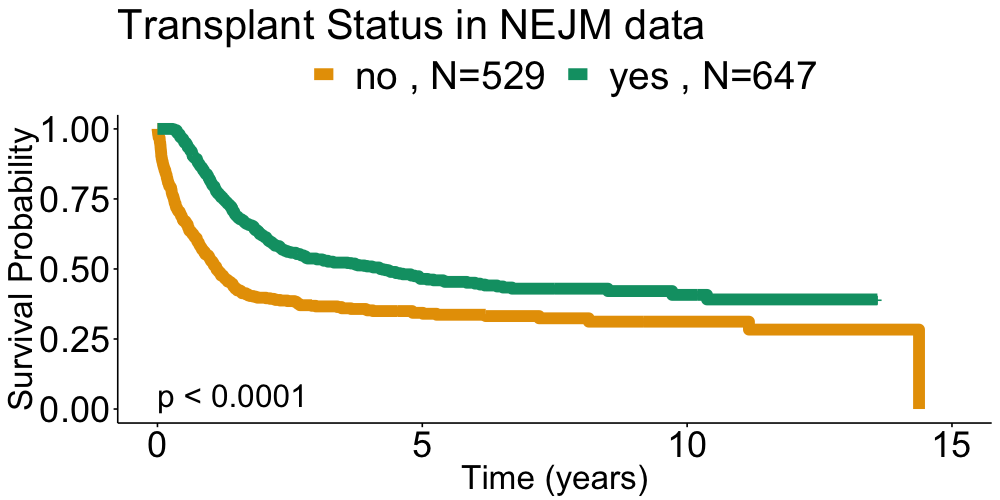

In [11]:
tmp <- nejm_data_tpl

tmp$comparison <- ifelse(tmp$TPL_o==1,"yes","no")
                               


surv_object <- Surv(time = tmp$OS, event = tmp$OS_Status)
fit <- survfit(surv_object ~ comparison, data = tmp)
p <- plot_surv_curves(fit,submain = "Transplant Status in NEJM data",y="Survival Probability",val=c("#e79f00", "#009E73"))
set_notebook_plot_size(10,5)
p

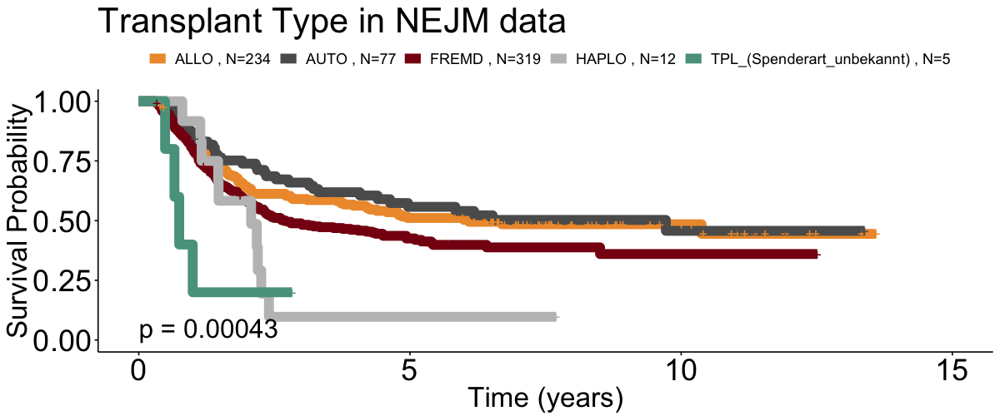

In [12]:
tmp <- nejm_data_tpl

tmp$comparison <- tmp$TPL_type
                               


surv_object <- Surv(time = tmp$OS, event = tmp$OS_Status)
fit <- survfit(surv_object ~ comparison, data = tmp)
p <- plot_surv_curves(fit,submain = "Transplant Type in NEJM data",y="Survival Probability",font.legend = 13)
set_notebook_plot_size(12,5)
p

# Comparison young/elderly patients

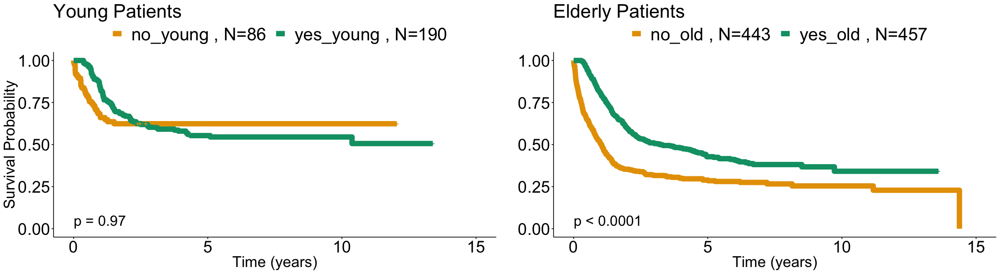

In [318]:
tmp <- nejm_data_tpl
tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                         ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
p <- plot_surv_curves(fit,submain ="Young Patients",y="Survival Probability",val=c("#e79f00", "#009E73"))$plot
surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
q <- plot_surv_curves(fit,submain = "Elderly Patients",y="",val=c("#e79f00", "#009E73"))$plot
set_notebook_plot_size(22,6)
do.call("grid.arrange",c(list(p,q),nrow=1))


# look at component repartition of those young patients to spot any unusual pattern.

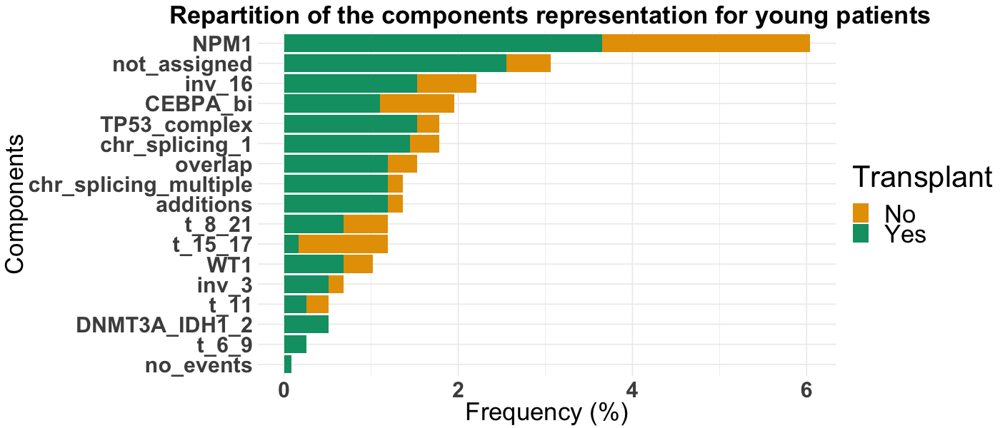

In [319]:
df_tmp <- nejm_data_tpl[nejm_data_tpl$Age<40,c(comp,"TPL_o")]

df_tmp_no_tpl <- df_tmp[df_tmp$TPL_o==0,]
no_tpl <- data.frame(freq = 100*colSums(df_tmp_no_tpl[,comp])/nrow(nejm_data_tpl),Transplant="No")
no_tpl$names <- rownames(no_tpl)

df_tmp_tpl <- df_tmp[df_tmp$TPL_o==1,]
tpl <- data.frame(freq = 100*colSums(df_tmp_tpl[,comp])/nrow(nejm_data_tpl),Transplant="Yes")
tpl$names <- rownames(tpl)

r <- rbind(no_tpl,tpl)

r$names <- str_replace(r$names,"full_component_","")
p <- ggplot(r,aes(reorder(names,freq),freq,fill=Transplant))+
        geom_bar(stat="identity",aes(fill=Transplant))+
        coord_flip()+
        xlab("Components") + ylab("Frequency over the cohort (%)")+scale_fill_manual(values=c("#e79f00", "#009E73"))+
scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+
labs(fill='Transplant') +ggtitle(" Repartition of the components representation for young patients")+
theme(axis.text.x=element_text(size=22,face="bold"),axis.title.x = element_text(size=25),axis.text.y=element_text(size=22,face="bold"),axis.title.y = element_text(size=25),legend.text = element_text(size=25),legend.title = element_text(size=30),
      plot.title = element_text(size=25,face="bold",hjust=0.5))+
                   ylab("Frequency (%)")+xlab("Components")
set_notebook_plot_size(14,6)
                   p

# .2) By Component

In [132]:
p <- list()
# for (co in comp) {
for (co in c("full_component_t_8_21","full_component_CEBPA_bi","full_component_WT1","full_component_t_6_9")){
    tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    tmp$comparison <- ifelse(tmp$TPL_o==1,"yes","no")
                               


    surv_object <- Surv(time = tmp$OS, event = tmp$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    p[[co]] <- plot_surv_curves(fit,submain = str_remove(co,"full_component_"),y=ifelse(co=="full_component_t_8_21","Survival Probability","")
                                ,val=c("#e79f00", "#009E73"),break.time.by=3)$plot
}

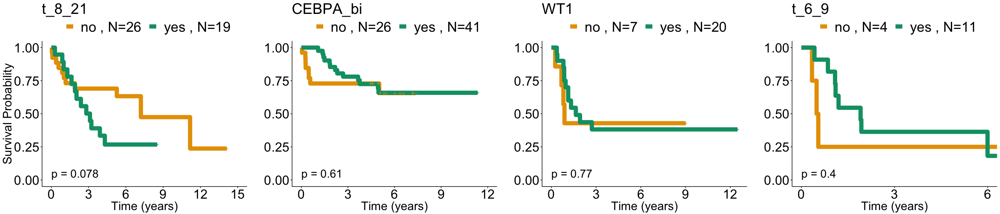

In [133]:
set_notebook_plot_size(28,6)
# do.call("grid.arrange",c(p,nrow=1))
do.call("grid.arrange",c(p,nrow=1))

### Investigation on components not benefiting from transplant : is it due to age bias?

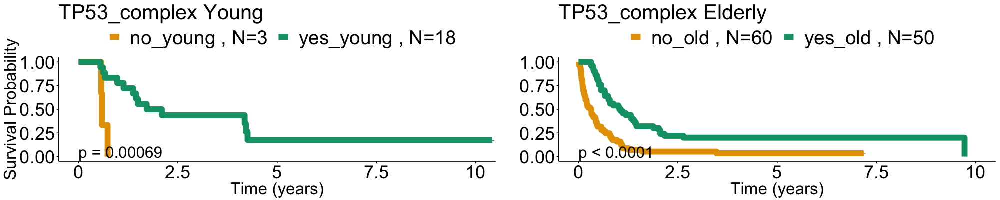

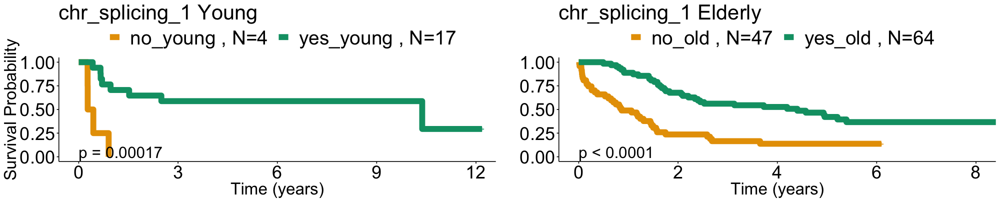

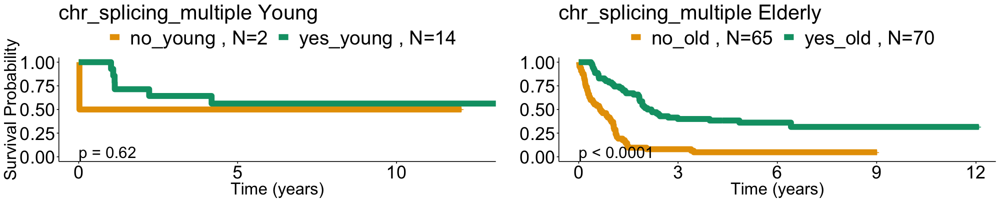

In [323]:
set_notebook_plot_size(20,4)

# for (co in c("full_component_t_8_21","full_component_CEBPA_bi","full_component_WT1","full_component_t_6_9")){
for (co in c("full_component_TP53_complex","full_component_chr_splicing_1","full_component_chr_splicing_multiple")){
# for (co in comp[comp!="full_component_no_events"]){
    tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                             ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                    ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

    surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
    p <- plot_surv_curves(fit,submain = paste(str_remove(co,"full_component_"),"Young"),y="Survival Probability",val=c("#e79f00", "#009E73"))$plot

    surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
    q <- plot_surv_curves(fit,submain = paste(str_remove(co,"full_component_"),"Elderly"),y="",val=c("#e79f00", "#009E73"))$plot

    do.call("grid.arrange",c(list(p,q),nrow=1))
}

# .2) By molecular event

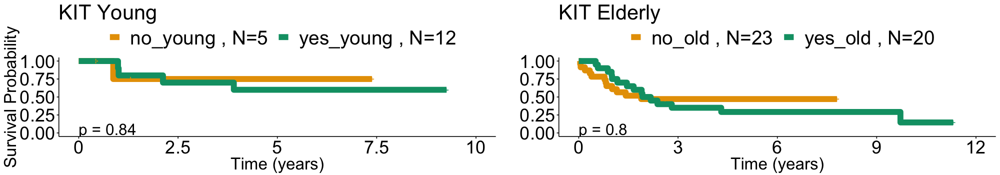

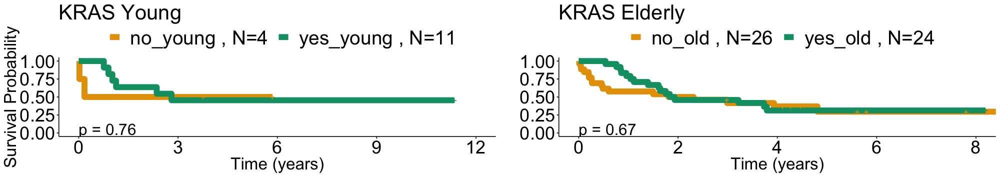

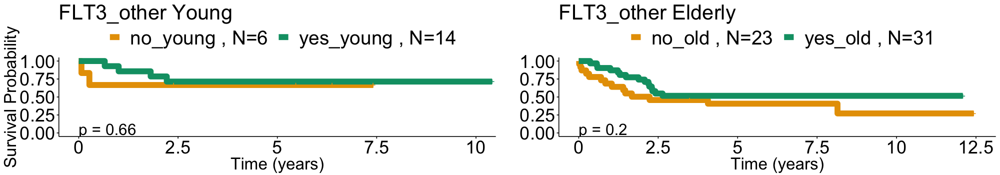

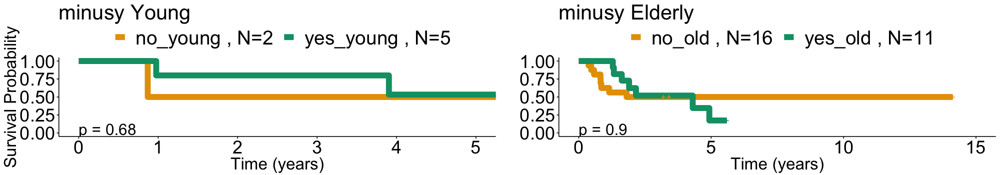

In [352]:
# Not benefiting:
set_notebook_plot_size(20,3.5)
for (co in c("KIT","KRAS","FLT3_other","minusy")){
    tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    if(nrow(tmp)>=20){
        tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                                 ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                        ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

        surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
        p <- plot_surv_curves(fit,submain = paste(co,"Young"),y="Survival Probability",val=c("#e79f00", "#009E73"))$plot

        surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
        q <- plot_surv_curves(fit,submain = paste(co,"Elderly"),y="",val=c("#e79f00", "#009E73"))$plot

        do.call("grid.arrange",c(list(p,q),nrow=1))
    }
}

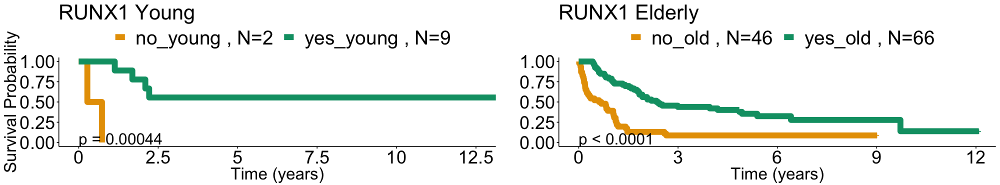

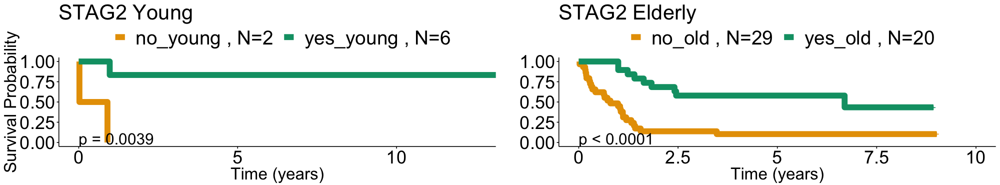

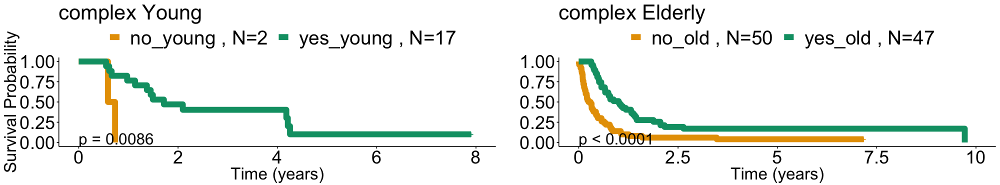

In [353]:
# Benefiting:
set_notebook_plot_size(20,3.7)
for (co in c("RUNX1","STAG2","complex")){
        tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    if(nrow(tmp)>=20){
        tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                                 ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                        ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

        surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
        p <- plot_surv_curves(fit,submain = paste(co,"Young"),y="Survival Probability",val=c("#e79f00", "#009E73"))$plot

        surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
        q <- plot_surv_curves(fit,submain = paste(co,"Elderly"),y="",val=c("#e79f00", "#009E73"))$plot

        do.call("grid.arrange",c(list(p,q),nrow=1))
    }
}

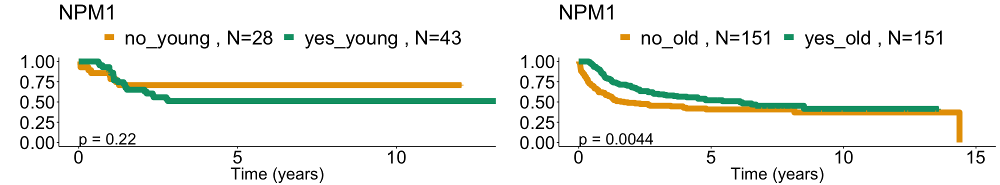

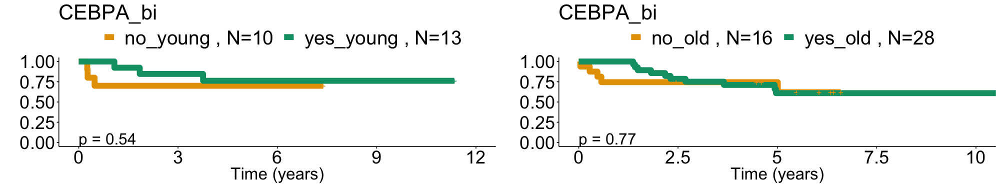

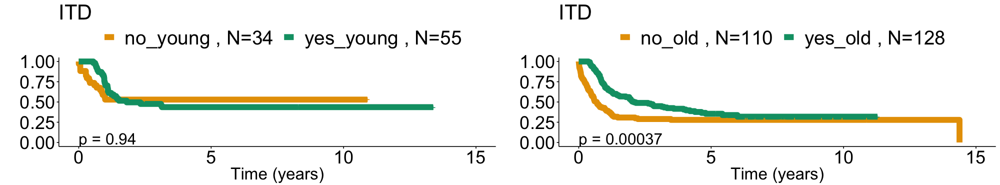

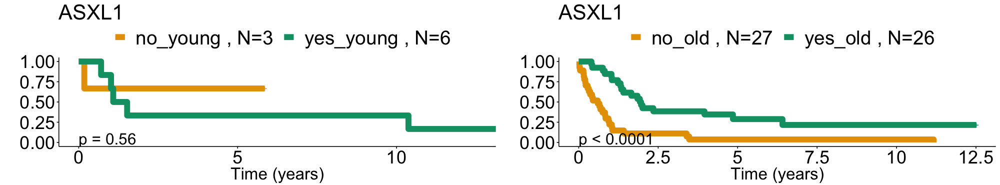

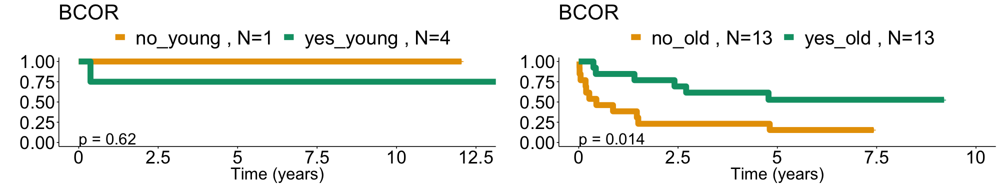

...

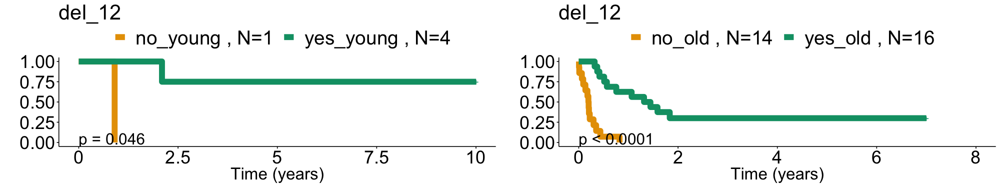

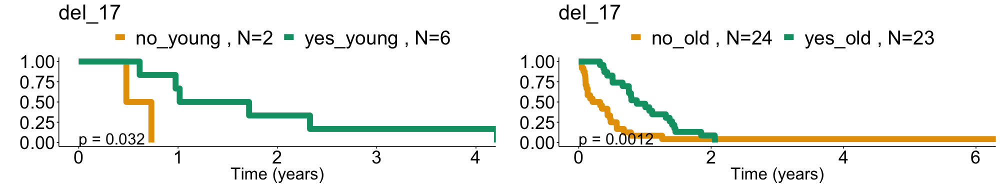

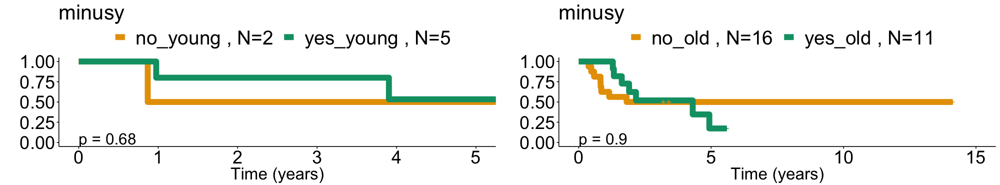

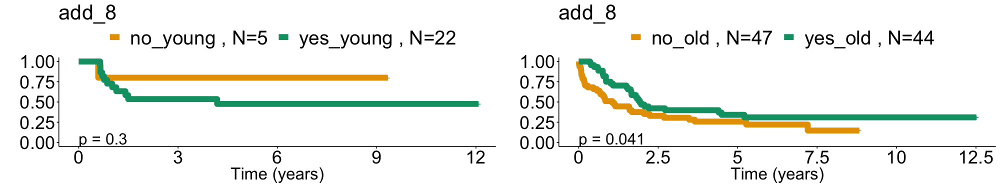

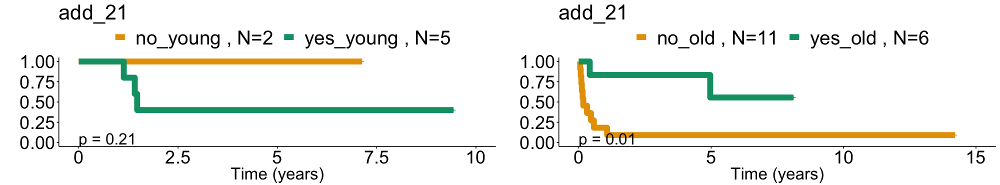

In [350]:
for (co in c(gen,cyto)){
    tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    if(nrow(tmp)>=20){
        tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                                 ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                        ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

        surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
        p <- plot_surv_curves(fit,submain = str_remove(co,"full_component_"),y=ifelse(co=="full_component_inv_16","Survival Probability",""),val=c("#e79f00", "#009E73"))$plot

        surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
        fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
        q <- plot_surv_curves(fit,submain = str_remove(co,"full_component_"),y=ifelse(co=="full_component_inv_16","Survival Probability",""),val=c("#e79f00", "#009E73"))$plot
        if(nrow(tmp[tmp$Age<40,]) >2 & nrow(tmp[tmp$Age>=40,])>2 ){  ## handle case with one patient in a plot
            do.call("grid.arrange",c(list(p,q),nrow=1))
        }

    }
}

# .3) By ELN

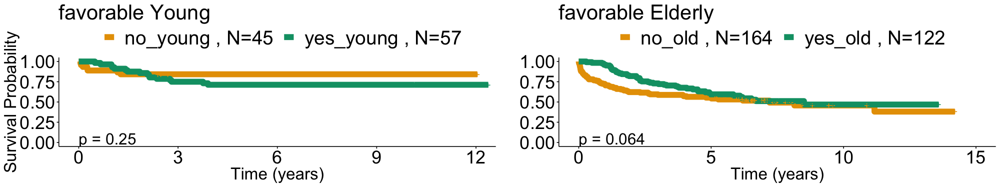

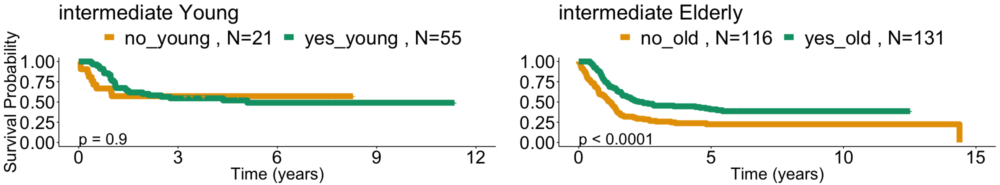

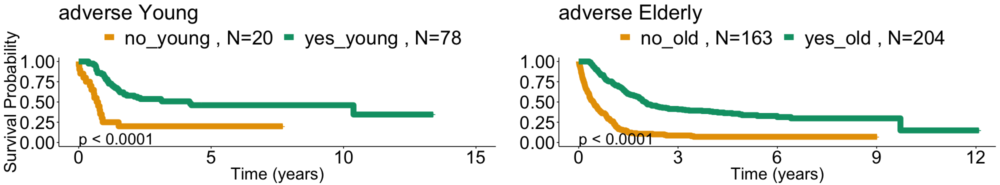

In [355]:

p <- list()
for (co in c("eln_2017_favorable","eln_2017_intermediate","eln_2017_adverse")) {
    tmp <- nejm_data_tpl[nejm_data_tpl[,co]==1,]
    tmp$comparison <- ifelse(tmp$TPL_o==1 & tmp$Age<40,"yes_young",
                                 ifelse(tmp$TPL_o==1 & tmp$Age>=40,"yes_old",
                                        ifelse(tmp$TPL_o==0 & tmp$Age<40,"no_young","no_old")))

    surv_object <- Surv(time = tmp[tmp$Age<40,]$OS, event = tmp[tmp$Age<40,]$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age<40,])
    p <- plot_surv_curves(fit,submain = paste(str_remove(co,"eln_2017_"),"Young"),y="Survival Probability",val=c("#e79f00", "#009E73"))$plot

    surv_object <- Surv(time = tmp[tmp$Age>=40,]$OS, event = tmp[tmp$Age>=40,]$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp[tmp$Age>=40,])
    q <- plot_surv_curves(fit,submain = paste(str_remove(co,"eln_2017_"),"Elderly"),y="",val=c("#e79f00", "#009E73"))$plot

    do.call("grid.arrange",c(list(p,q),nrow=1))
}
# set_notebook_plot_size(28,6)
# do.call("grid.arrange",c(p,nrow=1))

In [18]:
# 3) Differences within transplant :


In [200]:
mean(nejm_data_tpl[!is.na(nejm_data_tpl$TPL_date),]$Age)

[1] 45.46832

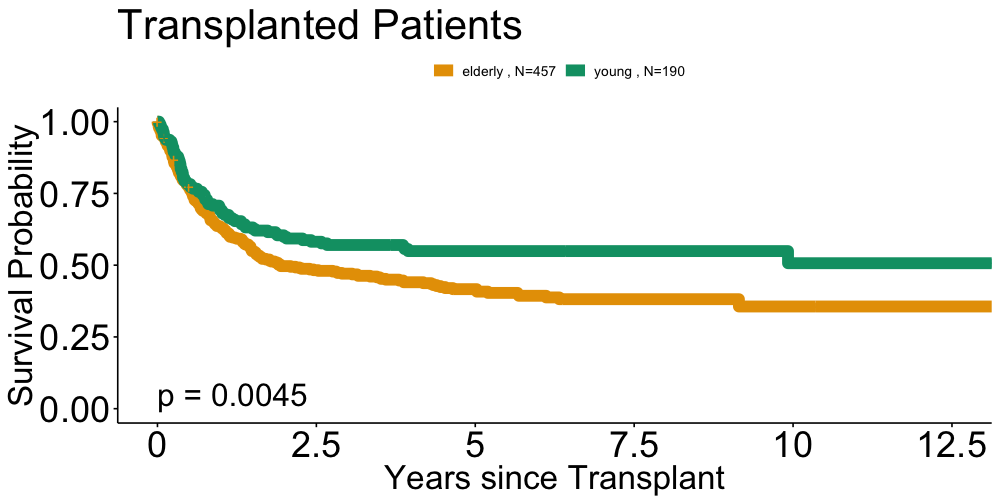

In [357]:
set_notebook_plot_size(10,5)
tmp <- nejm_data_tpl[!is.na(nejm_data_tpl$TPL_date),]
tmp$OS_transplant <- tmp$OS - tmp$TPL_date
tmp$comparison <- ifelse( tmp$Age <40 ,"young","elderly")

#     tmp$comparison <- ifelse(tmp[,co]==1  ,"mut","wt")

surv_object <- Surv(time = tmp$OS_transplant, event = tmp$OS_Status)
fit <- survfit(surv_object ~ comparison, data = tmp)
plot_surv_curves(fit,x="Years since Transplant",submain = "Transplanted Patients",y="Survival Probability",val=c("#e79f00", "#009E73","red","blue"),font.legend=10)$plot


In [379]:
p <- list()
tmp <- nejm_data_tpl[is.na(nejm_data_tpl$TPL_date),]
tmp$OS_transplant <- tmp$OS 
# for (co in c(gen,cyto)){
for (co in comp){
    tmp$comparison <- ifelse(tmp[,co]==1 & tmp$Age <40 ,"mut_young",
                            ifelse(tmp[,co]==1 & tmp$Age >=40 ,"mut_old",
                                  ifelse(tmp[,co]==0 & tmp$Age <40 ,"wt_young","wt_old")))

    res_mut <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("mut_young","mut_old"),])
    res_mut <- ifelse(is.null(unlist(res_mut$p.value[1])),"",ifelse(round(res_mut$p.value[1],4)==0,"pmut<0.0001",paste("pmut= ",round(res_mut$p.value[1],4),sep="")))
    
    res_wt <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("wt_young","wt_old"),])
   
    res_wt <- ifelse(is.null(unlist(res_wt$p.value[1])),"",ifelse(round(res_wt$p.value[1],4)==0,"pwt<0.0001",paste("pwt= ",round(res_wt$p.value[1],4),sep="")))
    
    surv_object <- Surv(time = tmp$OS_transplant, event = tmp$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    
    p[[co]] <- plot_surv_curves(fit,pval=res_mut,submain = co,x="Survival since Transplant",y="Survival Probability",val=c("#EE9937","#5C5C5C","#2b8cbe","#BFBFBF"),font.legend=10)$plot+
                    annotate("text",label=res_wt,x=1.5,y=0.18,size=8)
}
tmp <- nejm_data_tpl[!is.na(nejm_data_tpl$TPL_date),]
tmp$OS_transplant <- tmp$OS -tmp$TPL_date
# for (co in c(gen,cyto)){
for (co in comp){
    tmp$comparison <- ifelse(tmp[,co]==1 & tmp$Age <40 ,"mut_young",
                            ifelse(tmp[,co]==1 & tmp$Age >=40 ,"mut_old",
                                  ifelse(tmp[,co]==0 & tmp$Age <40 ,"wt_young","wt_old")))

    res_mut <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("mut_young","mut_old"),])
    res_mut <- ifelse(is.null(unlist(res_mut$p.value[1])),"",ifelse(round(res_mut$p.value[1],4)==0,"pmut<0.0001",paste("pmut= ",round(res_mut$p.value[1],4),sep="")))
    
    res_wt <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("wt_young","wt_old"),])
   
    res_wt <- ifelse(is.null(unlist(res_wt$p.value[1])),"",ifelse(round(res_wt$p.value[1],4)==0,"pwt<0.0001",paste("pwt= ",round(res_wt$p.value[1],4),sep="")))
    
    surv_object <- Surv(time = tmp$OS_transplant, event = tmp$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    
    q[[co]] <- plot_surv_curves(fit,pval=res_mut,submain = co,x="Years since Transplant",y="Survival Probability",val=c("#EE9937","#5C5C5C","#2b8cbe","#BFBFBF"),font.legend=10)$plot+
                    annotate("text",label=res_wt,x=1.5,y=0.18,size=8)
}



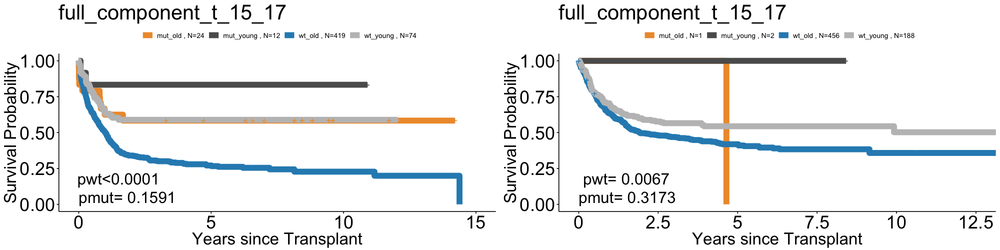

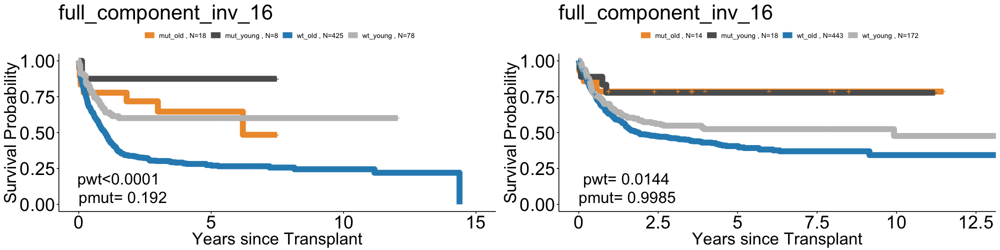

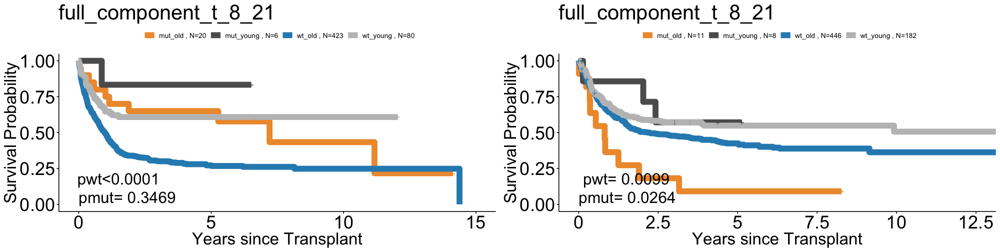

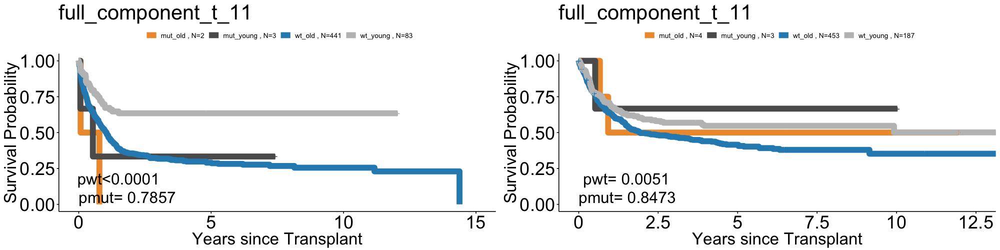

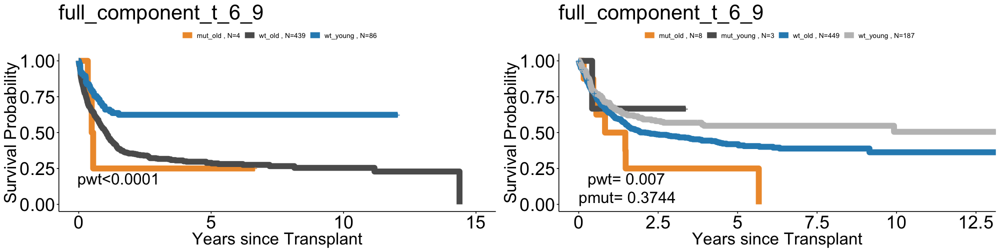

...

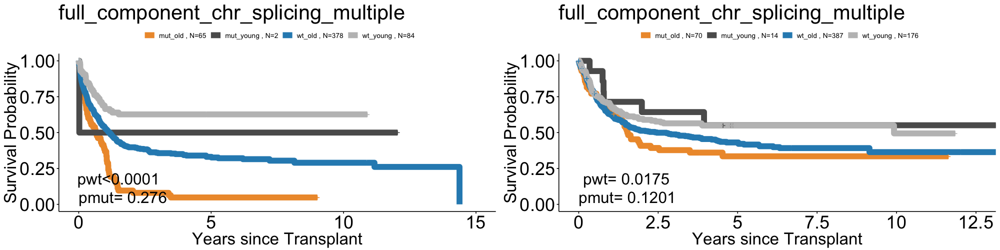

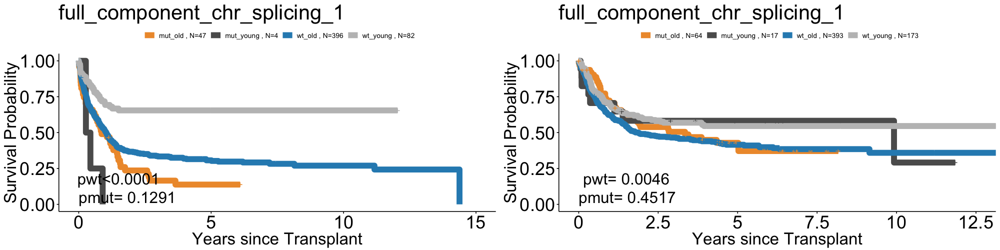

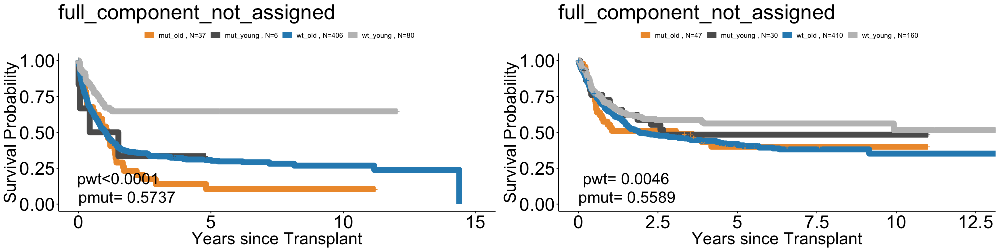

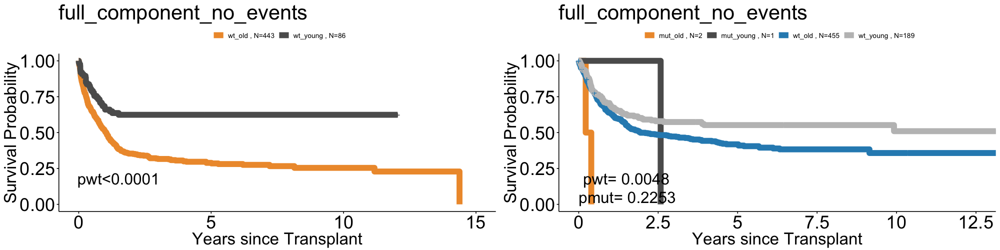

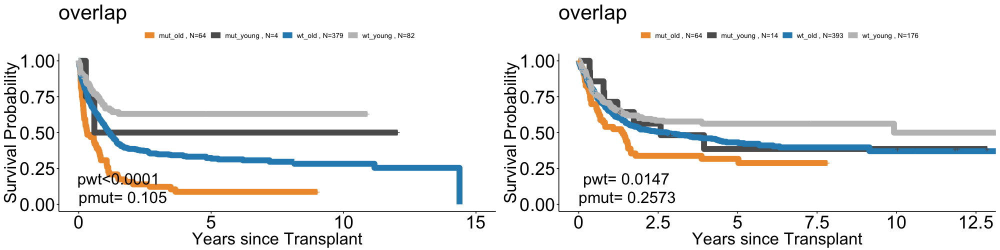

In [381]:
set_notebook_plot_size(20,5)
for (co in comp){
    grid.arrange(p[[co]],q[[co]],ncol=2)
}

In [362]:
p <- list()
tmp <- nejm_data_tpl[!is.na(nejm_data_tpl$TPL_date),]
tmp$OS_transplant <- tmp$OS - tmp$TPL_date
# for (co in c(gen,cyto)){
for (co in comp){
    tmp$comparison <- ifelse(tmp[,co]==1 & tmp$Age <40 ,"mut_young",
                            ifelse(tmp[,co]==1 & tmp$Age >=40 ,"mut_old",
                                  ifelse(tmp[,co]==0 & tmp$Age <40 ,"wt_young","wt_old")))
#     tmp$comparison <- ifelse(tmp[,co]==1  ,"mut","wt")
    res_mut <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("mut_young","mut_old"),])
    res_mut <- ifelse(is.null(unlist(res_mut$p.value[1])),"",ifelse(round(res_mut$p.value[1],4)==0,"pmut<0.0001",paste("pmut= ",round(res_mut$p.value[1],4),sep="")))
    
    res_wt <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("wt_young","wt_old"),])
   
    res_wt <- ifelse(is.null(unlist(res_wt$p.value[1])),"",ifelse(round(res_wt$p.value[1],4)==0,"pwt<0.0001",paste("pwt= ",round(res_wt$p.value[1],4),sep="")))
    
    surv_object <- Surv(time = tmp$OS_transplant, event = tmp$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    
    p[[co]] <- plot_surv_curves(fit,pval=res_mut,submain = co,x="Years since Transplant",y="Survival Probability",val=c("#EE9937","#5C5C5C","#2b8cbe","#BFBFBF"),font.legend=10)$plot+
                    annotate("text",label=res_wt,x=1.5,y=0.18,size=8)
}

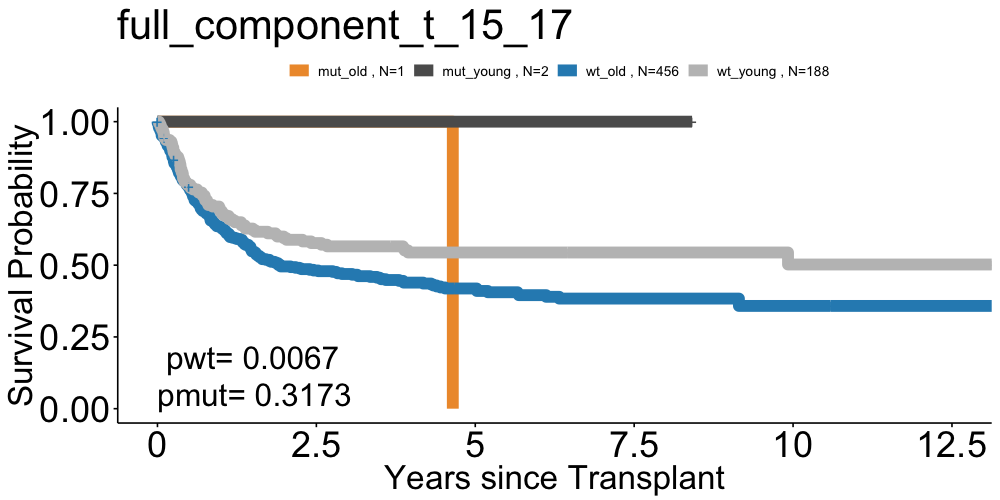

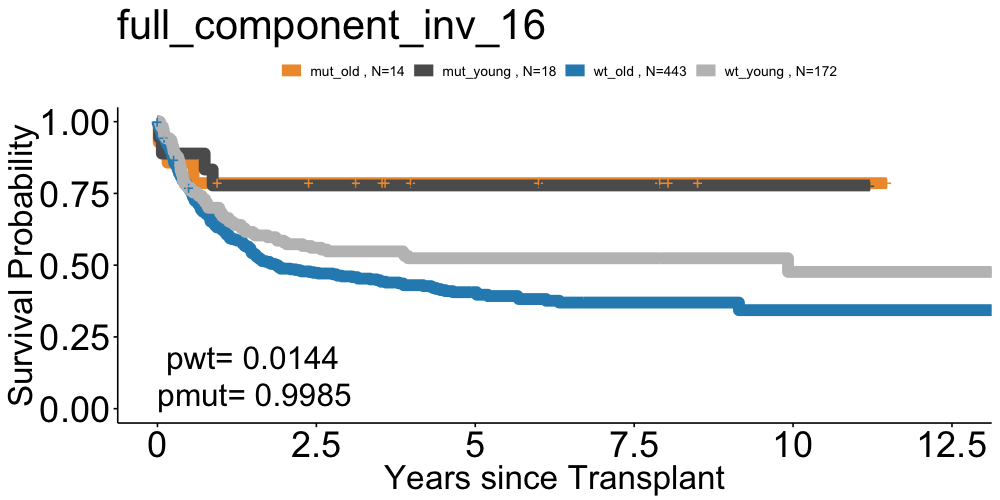

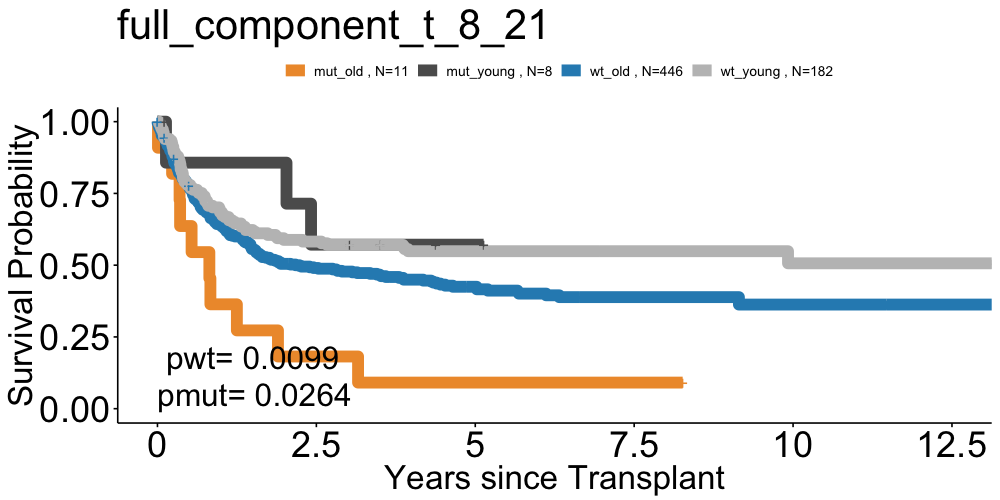

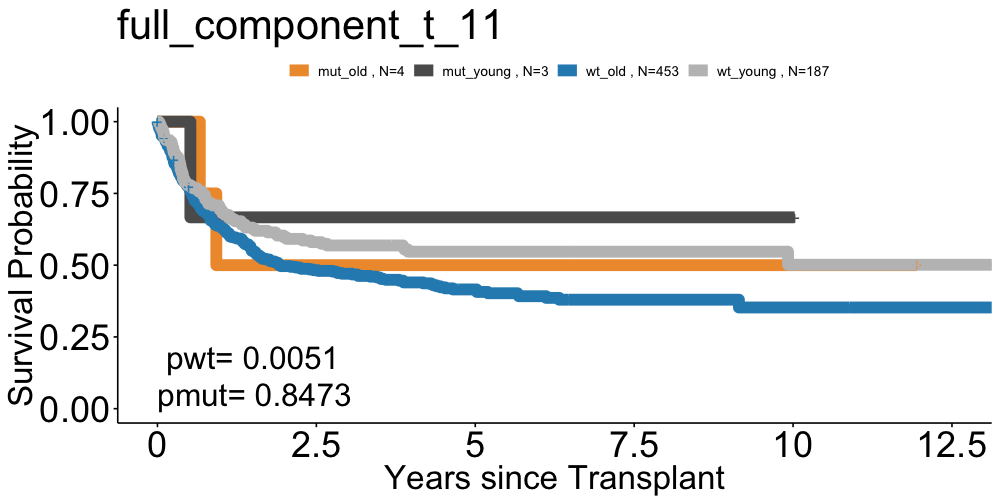

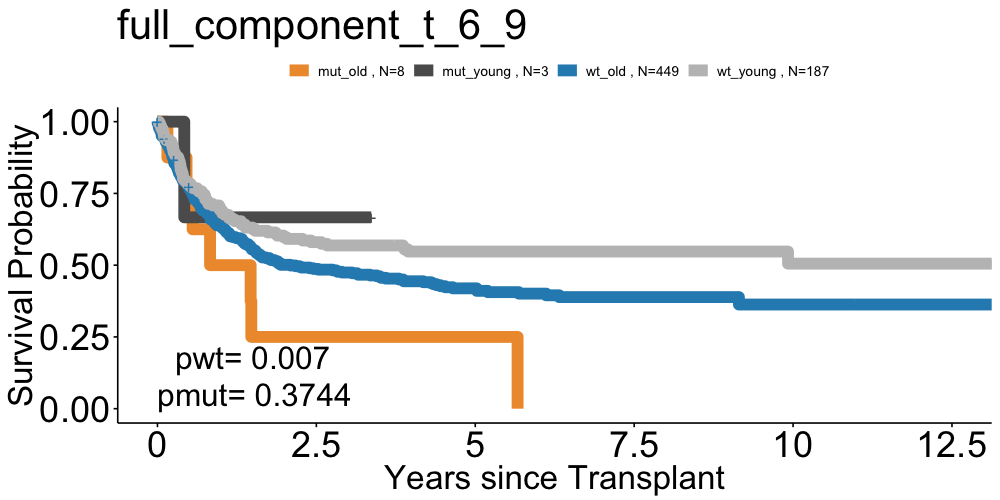

...

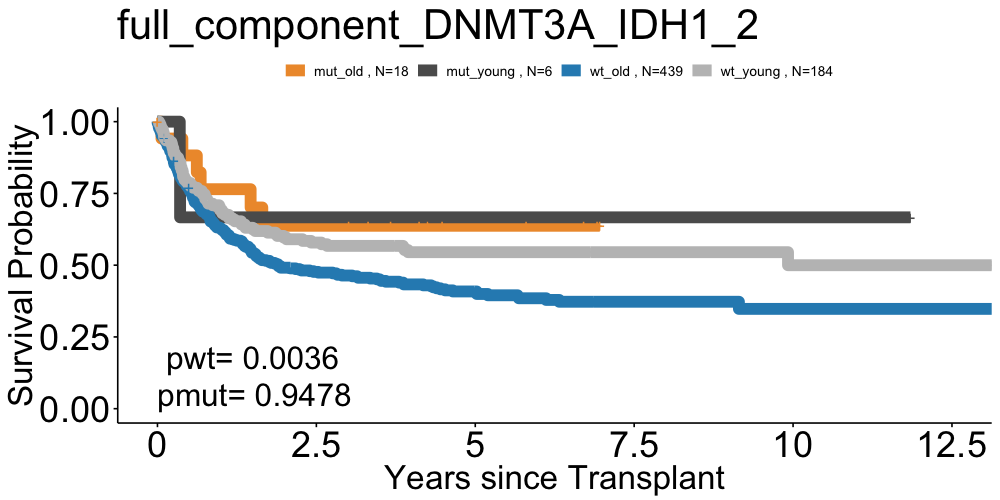

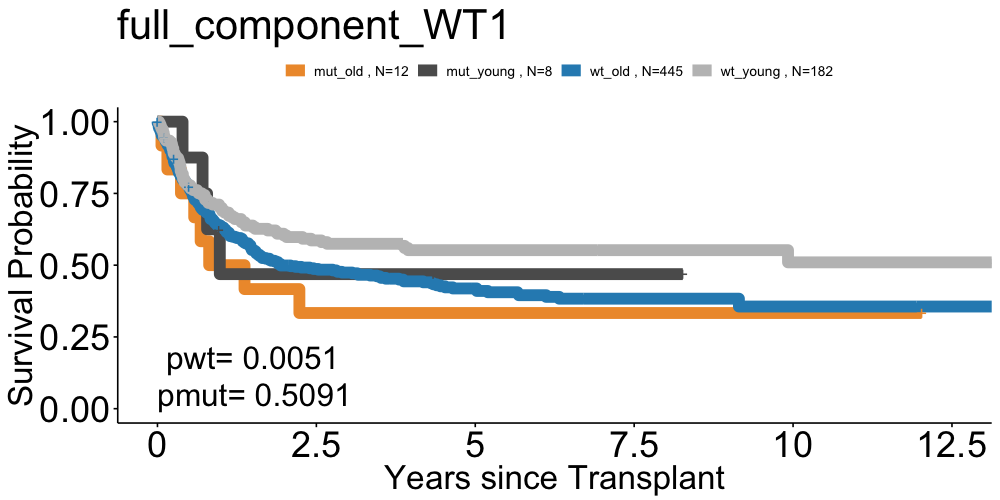

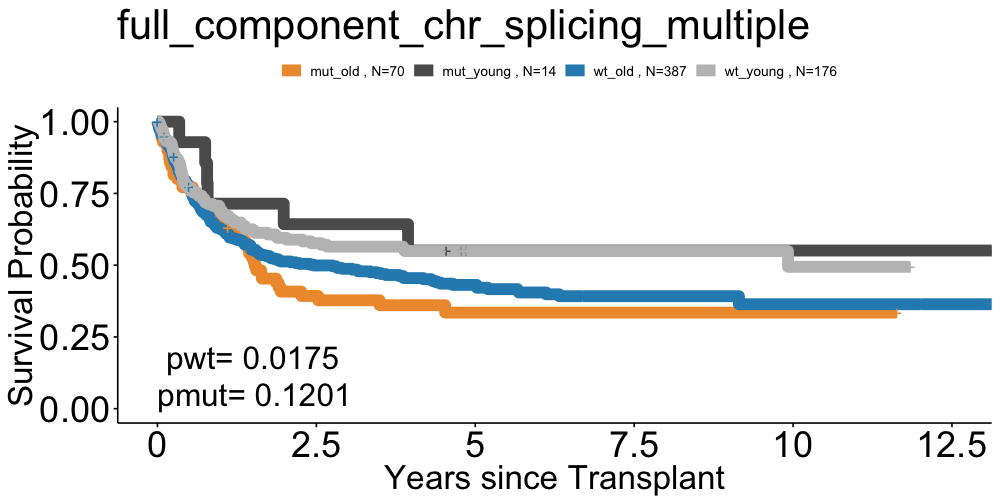

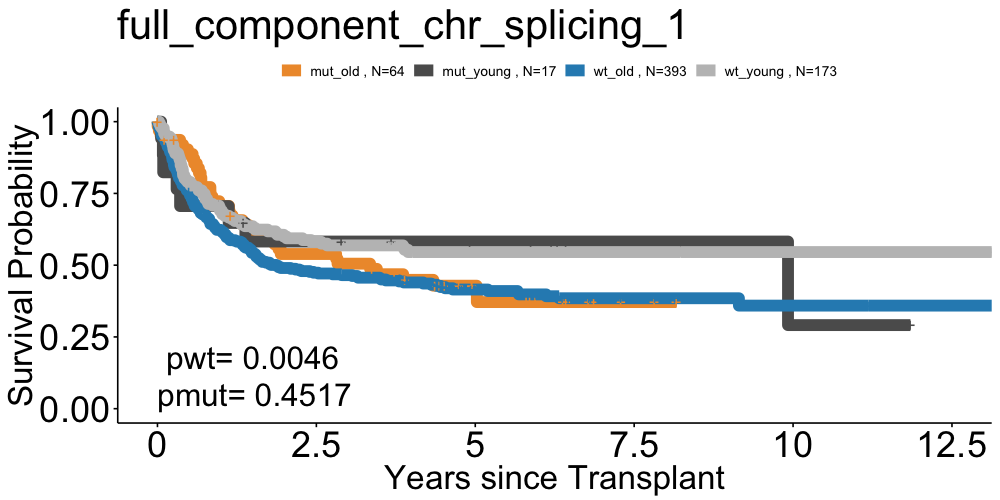

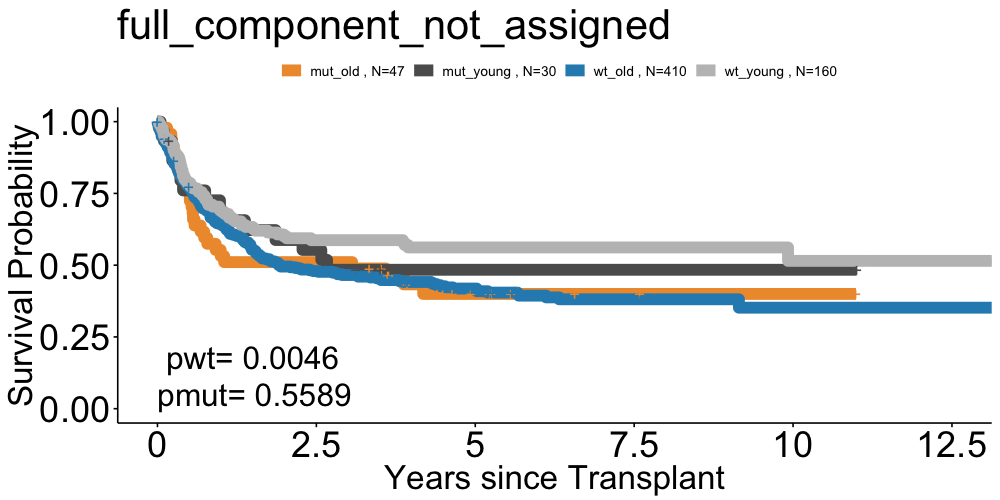

$full_component_t_15_17

$full_component_inv_16

$full_component_t_8_21

$full_component_t_11

$full_component_t_6_9

$full_component_inv_3

$full_component_additions

$full_component_TP53_complex

$full_component_NPM1

$full_component_CEBPA_bi

$full_component_DNMT3A_IDH1_2

$full_component_WT1

$full_component_chr_splicing_multiple

$full_component_chr_splicing_1

$full_component_not_assigned

$full_component_no_events

$overlap


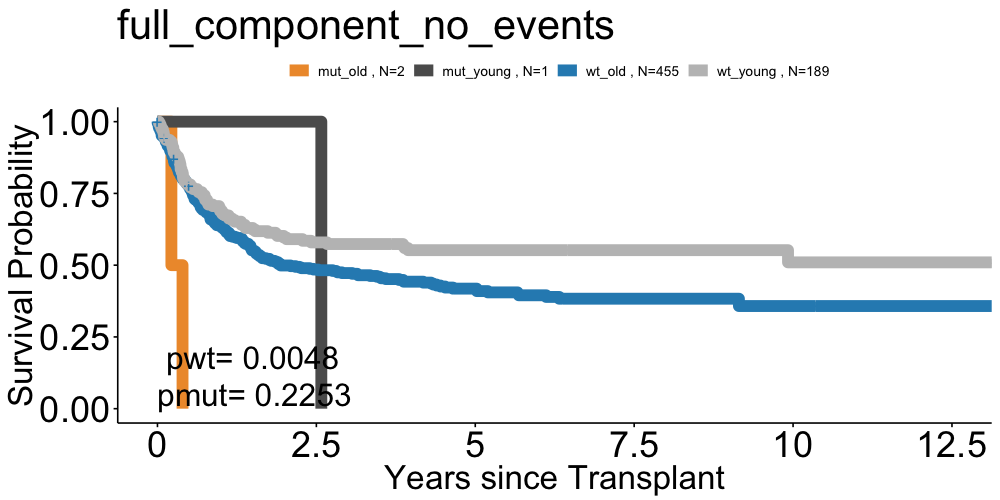

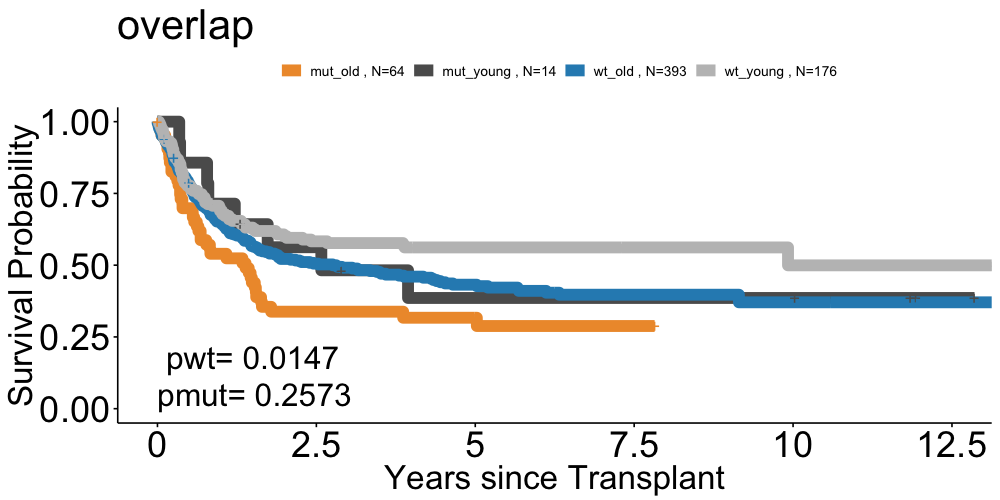

In [363]:
p

In [364]:
p <- list()
tmp <- nejm_data_tpl[!is.na(nejm_data_tpl$TPL_date),]
tmp$OS_transplant <- tmp$OS - tmp$TPL_date
# for (co in c(gen,cyto)){
for (co in c(gen,cyto)){
    tmp$comparison <- ifelse(tmp[,co]==1 & tmp$Age <40 ,"mut_young",
                            ifelse(tmp[,co]==1 & tmp$Age >=40 ,"mut_old",
                                  ifelse(tmp[,co]==0 & tmp$Age <40 ,"wt_young","wt_old")))
#     tmp$comparison <- ifelse(tmp[,co]==1  ,"mut","wt")
    res_mut <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("mut_young","mut_old"),])
    res_mut <- ifelse(is.null(unlist(res_mut$p.value[1])),"",ifelse(round(res_mut$p.value[1],4)==0,"pmut<0.0001",paste("pmut= ",round(res_mut$p.value[1],4),sep="")))
    
    res_wt <- pairwise_survdiff(Surv(OS_transplant,OS_Status)~comparison,data = tmp[tmp$comparison %in% c("wt_young","wt_old"),])
    res_wt <- ifelse(is.null(unlist(res_wt$p.value[1])),"",ifelse(round(res_wt$p.value[1],4)==0,"pwt<0.0001",paste("pwt= ",round(res_wt$p.value[1],4),sep="")))
    
    surv_object <- Surv(time = tmp$OS_transplant, event = tmp$OS_Status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    
    p[[co]] <- plot_surv_curves(fit,pval=res_mut,submain = co,x="Years since Transplant",y="Survival Probability",val=c("#EE9937","#5C5C5C","#2b8cbe","#BFBFBF"),font.legend=10)$plot+
                    annotate("text",label=res_wt,x=1.5,y=0.18,size=8)
}

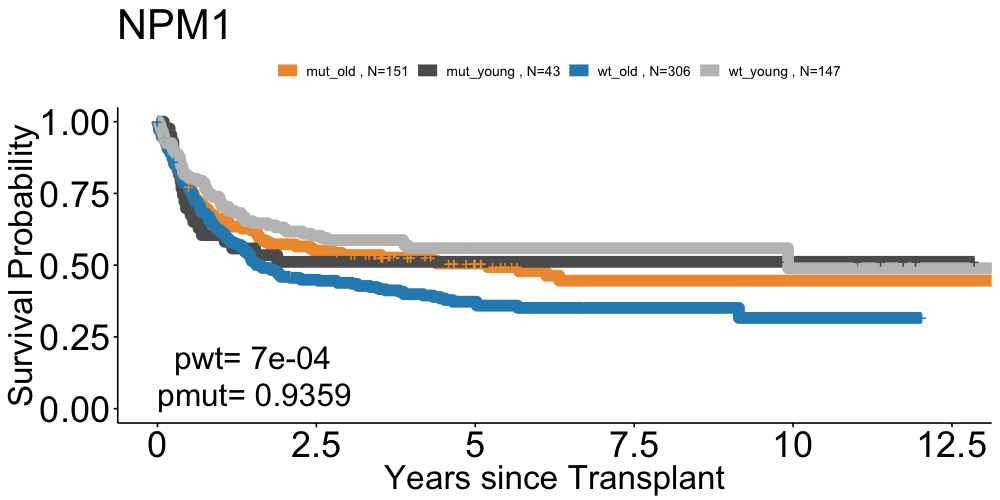

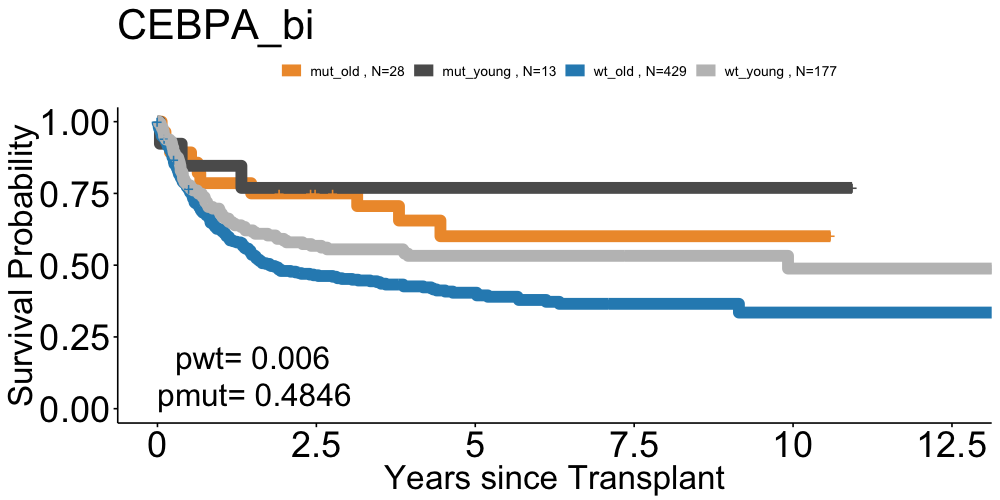

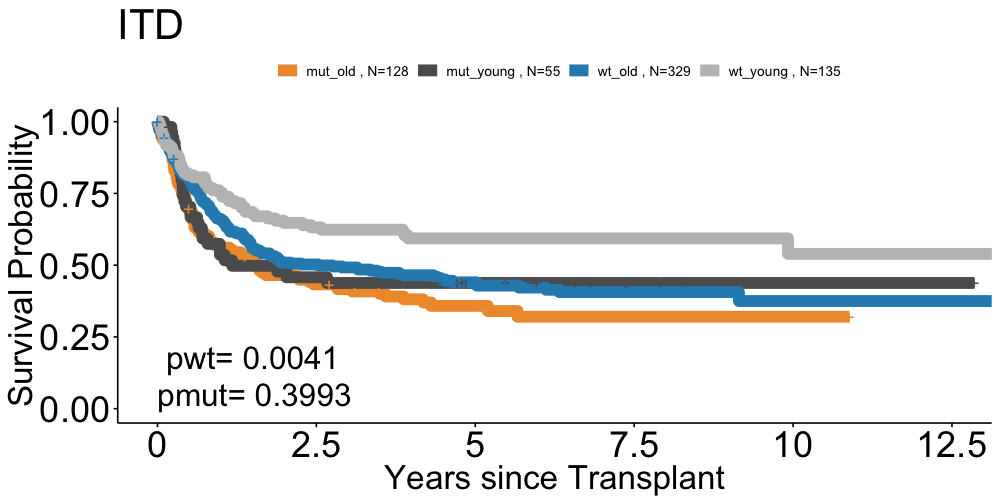

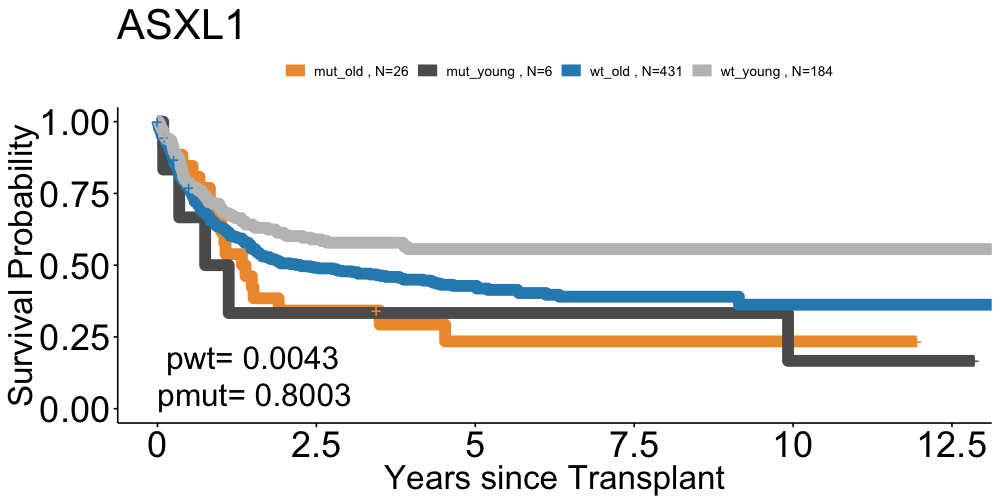

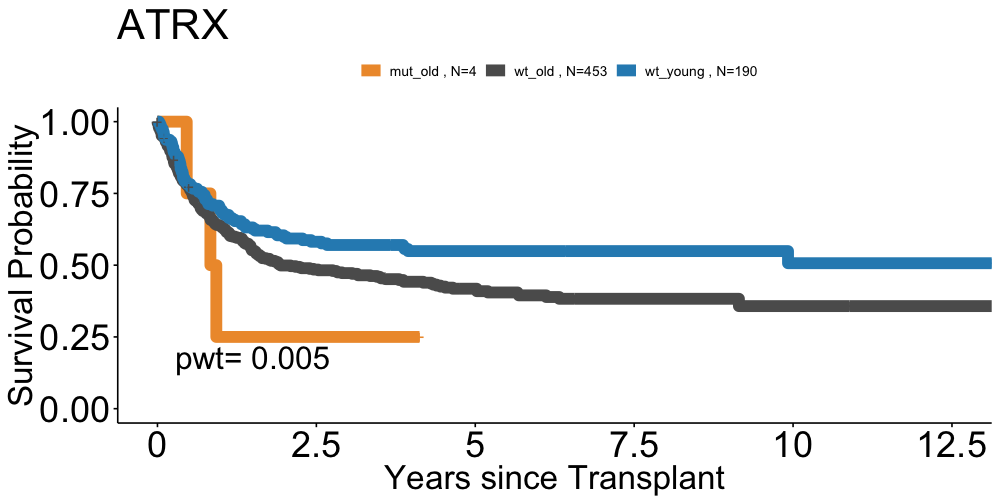

...

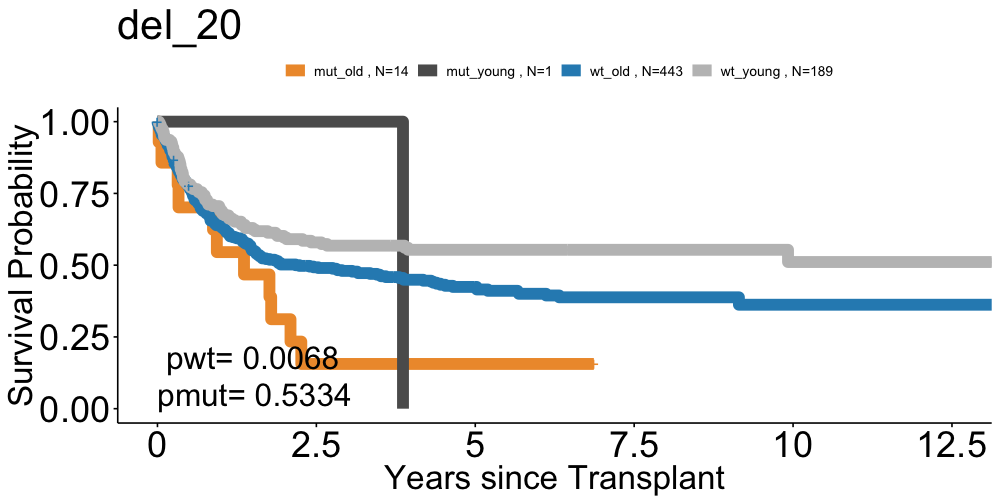

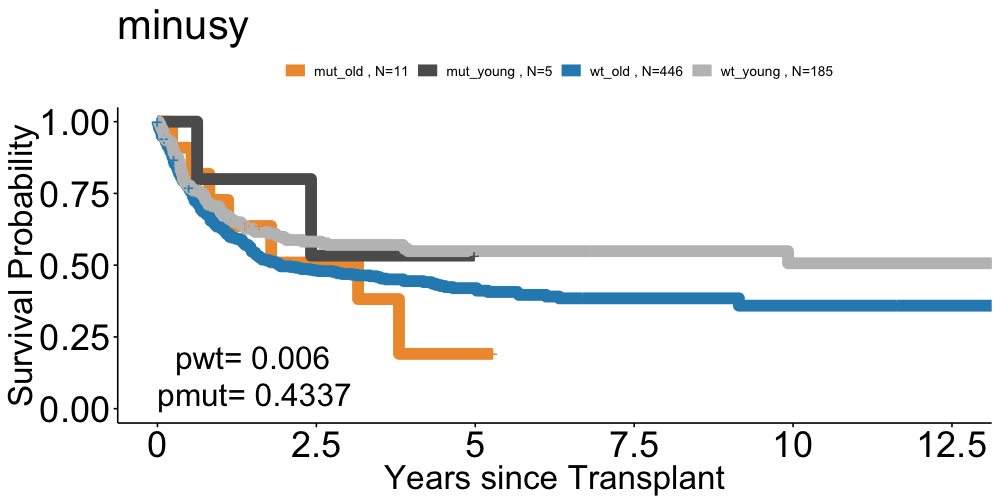

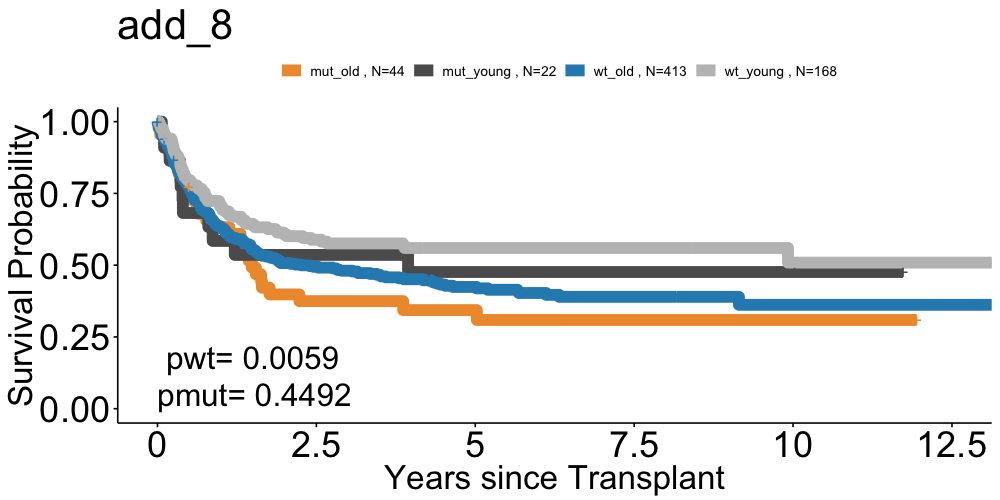

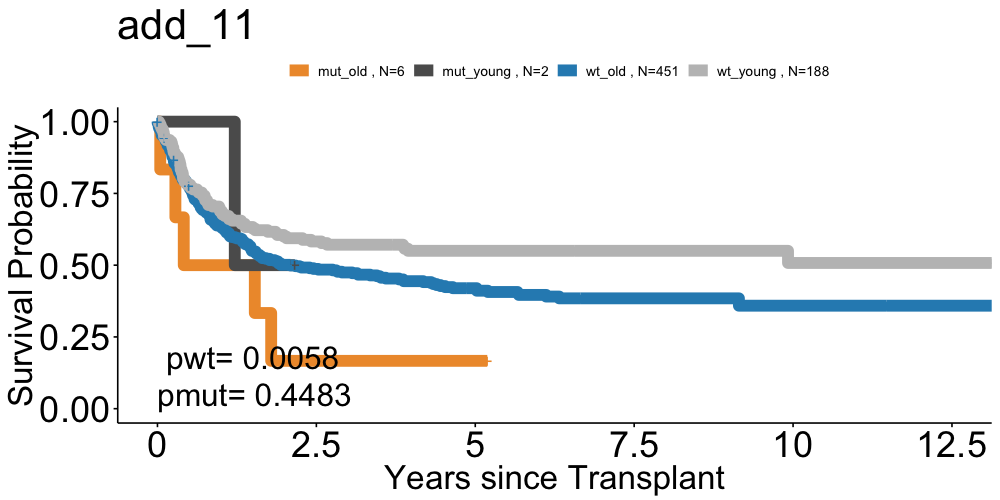

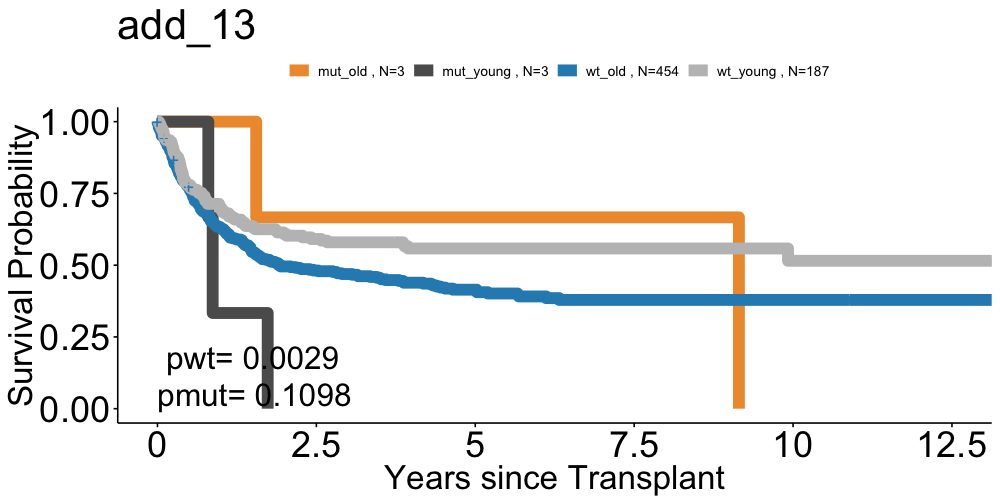

$NPM1

$CEBPA_bi

$ITD

$ASXL1

$ATRX

$BCOR

$BRAF

$CBL

$CBLB

$CDKN2A

$CREBBP

$CUX1

$DNMT3A

$EP300

$ETV6

$EZH2

$FBXW7

$FLT3

$GATA2

$GNAS

$IDH1

$IDH2

$IKZF1

$JAK2

$KDM5A

$KDM6A

$KIT

$KRAS

$MLL

$MLL2

$MLL3

$MLL5

$MPL

$MYC

$NF1

$NRAS

$PHF6

$PRPF40B

$PTEN

$PTPN11

$RAD21

$RB1

$RUNX1

$SF1

$SF3A1

$SF3B1

$SRSF2

$SH2B3

$STAG2

$TET2

$TP53

$U2AF1

$U2AF2

$WT1

$ZRSR2

$FLT3_TKD

$FLT3_other

$inv_16

$t_15_17

$t_8_21

$t_6_9

$inv_3

$t_9_22

$t_9_11

$t_v_11

$complex

$del_3

$del_5

$del_7

$del_9

$del_12

$del_17

$del_18

$del_20

$minusy

$add_8

$add_11

$add_13

$add_21

$add_22


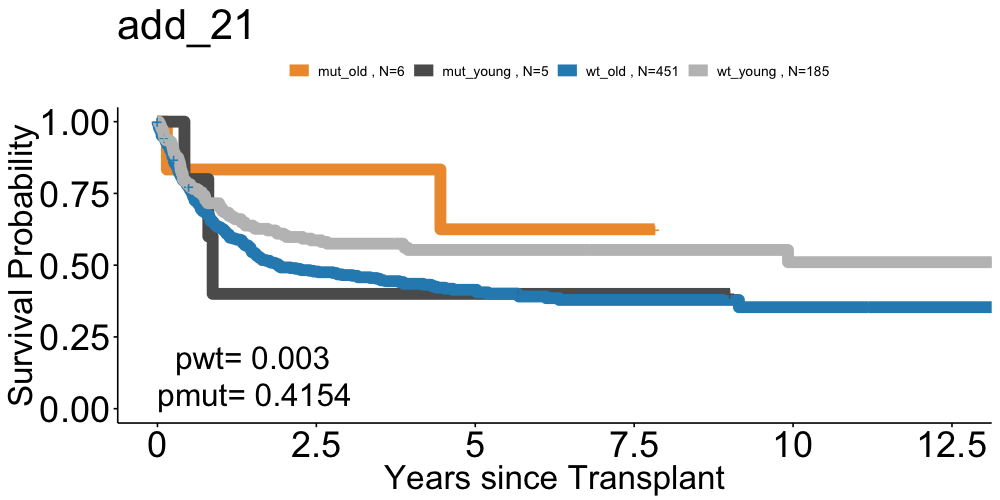

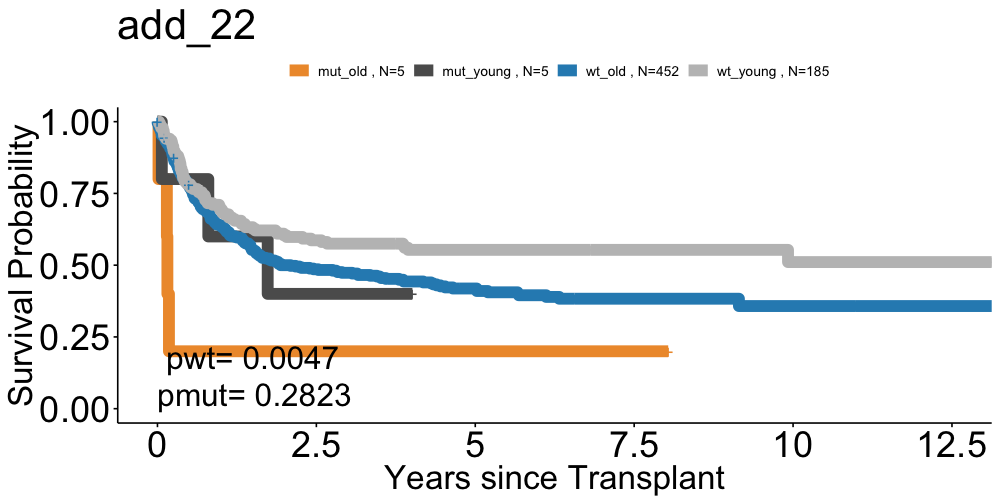

In [365]:
p